In [1]:
# Activate project
using Pkg
Pkg.activate("/Users/alessiogiorlandino/Desktop/SAM/Project.toml")
Base.active_project()
# Resolve dependencies
Pkg.resolve()

  Activating project at `~/Desktop/SAM`


  No Changes to `~/Desktop/SAM/Project.toml`
  No Changes to `~/Desktop/SAM/Manifest.toml`


In [88]:
using Optimisers: Adam
using EllipsisNotation: (..)
using FillArrays: Falses
import Makie, CairoMakie
using Makie: @colorant_str
import SamApp
using LinearAlgebra
using Statistics
using LaTeXStrings
using DelimitedFiles: readdlm

using BioSequences: LongRNA, @rna_str
using Statistics: mean, std, cor
import JLD2

using Plots
default(fmt = :png)


import RestrictedBoltzmannMachines as RBMs
import CudaRBMs, CenteredRBMs
using CudaRBMs: gpu, cpu
using CenteredRBMs: CenteredRBM, center, uncenter, center_from_data!
using RestrictedBoltzmannMachines: initialize!, RBM, xReLU, Potts, pcd!, Binary, log_pseudolikelihood, free_energy
using RBMsAnnealedImportanceSampling: aise, raise, logmeanexp, logstdexp, logvarexp

using MiniLoggers: global_logger, MiniLogger
global_logger(MiniLogger());

In [3]:
test_file = open("./DATA/test_X.txt","r")
train_file = open("./DATA/train_X.txt", "r")
train_label_file = open("./DATA/train_y.txt", "r")
test_label_file = open("./DATA/test_y.txt", "r")


test_X = transpose(readdlm(test_file))
train_fulldata_X = transpose(readdlm(train_file))
train_y =readdlm(train_label_file)
test_y =readdlm(test_label_file)

4157×1 Matrix{Float64}:
 2.0
 1.0
 0.0
 1.0
 0.0
 0.0
 1.0
 3.0
 0.0
 0.0
 ⋮
 2.0
 0.0
 1.0
 2.0
 3.0
 0.0
 1.0
 2.0
 3.0

In [40]:
function PCA(data)
    data_shape = size(data)
    cov_matrix = cov(data, dims=2)
    cov_eigenval = eigvals(cov_matrix)
    expl_ratio = cov_eigenval/sum(cov_eigenval)
    ort_trasf = eigvecs(cov_matrix)
    return transpose(ort_trasf)*data, expl_ratio,  ort_trasf
end
    

PCA (generic function with 1 method)

# Training RBMS

In [4]:
function callback(; rbm, iter, kw...)
    if iszero(iter % 100)
        Δt = @elapsed (lpl = mean(log_pseudolikelihood(rbm, data)))
        if iszero(iter % 1000)
            @info iter lpl Δt
        end
        write(logfile, "$iter $lpl \n")
    end

end

callback (generic function with 1 method)

[2023-05-04 15:42:05] Info: 1000 lpl = -0.12025314507271787, Δt = 0.418826209


[2023-05-04 15:42:56] Info: 2000 lpl = -0.1015664261348422, Δt = 0.433607583


[2023-05-04 15:43:50] Info: 3000 lpl = -0.0850963300523737, Δt = 0.436607667


[2023-05-04 15:44:44] Info: 4000 lpl = -0.0871796431409645, Δt = 0.43974025


[2023-05-04 15:45:38] Info: 5000 lpl = -0.08278860944597793, Δt = 0.478406917


[2023-05-04 15:46:34] Info: 6000 lpl = -0.0774376952964917, Δt = 0.45298225


[2023-05-04 15:47:30] Info: 7000 lpl = -0.07680429824202616, Δt = 0.463144708


[2023-05-04 15:48:25] Info: 8000 lpl = -0.0724113046843035, Δt = 0.461257625


[2023-05-04 15:49:18] Info: 9000 lpl = -0.0742220116395907, Δt = 0.452104167


[2023-05-04 15:50:21] Info: 10000 lpl = -0.06838267399738185, Δt = 0.467065209


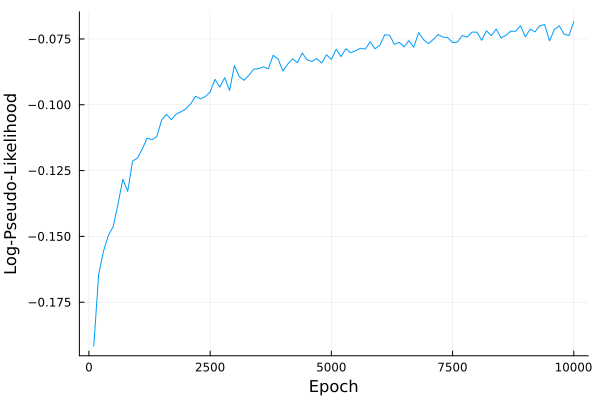

In [25]:
logfile = open("./Log/Stacked1.txt", "w+")
n_samples = size(train_fulldata_X)[2]
data = train_fulldata_X[:,1:n_samples]

visible_units = size(data)[1]
n_hidden1 = 256
rbm1 = center(RBM(Binary((visible_units,)), Binary((n_hidden1,)), zeros(visible_units, n_hidden1)));
initialize!(rbm1, data);
pcd!(
    rbm1, data; 
    batchsize=256, iters=10000, steps=10, optim=Adam(1f-3), l1_weights=1f-3,
    vm=data[.., rand(1:size(data)[end], 256)], callback
);

close(logfile)

logdata = readdlm("./Log/Stacked1.txt")
iter= logdata[:, 1]
lpl = logdata[:, 2]
plot(iter, lpl, legend=false)
xlabel!("Epoch")
ylabel!("Log-Pseudo-Likelihood")

[2023-05-04 15:52:01] Info: 1000 lpl = -0.38223374731043863, Δt = 0.159854291


[2023-05-04 15:52:18] Info: 2000 lpl = -0.35004448674542504, Δt = 0.165643666


[2023-05-04 15:52:40] Info: 3000 lpl = -0.3309382512297248, Δt = 0.167026208


[2023-05-04 15:52:59] Info: 4000 lpl = -0.319145072656971, Δt = 0.203994209


[2023-05-04 15:53:18] Info: 5000 lpl = -0.3115329338732605, Δt = 0.172339125


[2023-05-04 15:53:38] Info: 6000 lpl = -0.3095407045259575, Δt = 0.170853


[2023-05-04 15:53:57] Info: 7000 lpl = -0.3048470510994574, Δt = 0.166382208


[2023-05-04 15:54:18] Info: 8000 lpl = -0.3054900019414843, Δt = 0.17160375


[2023-05-04 15:54:37] Info: 9000 lpl = -0.30567278995137465, Δt = 0.187783459


[2023-05-04 15:54:57] Info: 10000 lpl = -0.3025607703182185, Δt = 0.169555792


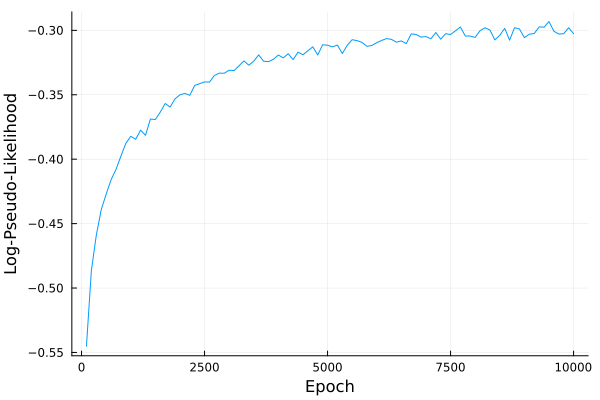

In [30]:
#Build data 
hidden_data1 = zeros(n_hidden1, n_samples)
for i in 1:n_samples
    hidden_data1[:,i]=RBMs.sample_h_from_v(rbm1, data[:,i]) 
end

logfile = open("./Log/Stacked2.txt", "w+")


n_hidden2 = 128
data = hidden_data1

rbm2 = center(RBM(Binary((n_hidden1,)), Binary((n_hidden2,)), zeros(n_hidden1, n_hidden2)));
initialize!(rbm2, data);

pcd!(
    rbm2, data; 
    batchsize=256, iters=10000, steps=10, optim=Adam(1f-3), l1_weights=1f-3,
    vm=hidden_data1[.., rand(1:size(hidden_data1)[end], 256)], callback
);

close(logfile)

logdata = readdlm("./Log/Stacked2.txt")
iter= logdata[:, 1]
lpl = logdata[:, 2]
plot(iter, lpl, legend=false)
xlabel!("Epoch")
ylabel!("Log-Pseudo-Likelihood") 

[2023-05-04 15:55:38] Info: 1000 lpl = -0.3798112164309635, Δt = 0.074742042


[2023-05-04 15:55:46] Info: 2000 lpl = -0.34478734795320837, Δt = 0.076425333


[2023-05-04 15:55:57] Info: 3000 lpl = -0.32952807148083263, Δt = 0.084233334


[2023-05-04 15:56:07] Info: 4000 lpl = -0.3175666986261222, Δt = 0.08998675


[2023-05-04 15:56:18] Info: 5000 lpl = -0.3132862870392676, Δt = 0.080013958


[2023-05-04 15:56:29] Info: 6000 lpl = -0.3076042692174674, Δt = 0.080481


[2023-05-04 15:56:41] Info: 7000 lpl = -0.3000842200620221, Δt = 0.081128375


[2023-05-04 15:56:52] Info: 8000 lpl = -0.29863780425117814, Δt = 0.082881125


[2023-05-04 15:57:02] Info: 9000 lpl = -0.2944257497537502, Δt = 0.080533459


[2023-05-04 15:57:13] Info: 10000 lpl = -0.2896026418032613, Δt = 0.126871334


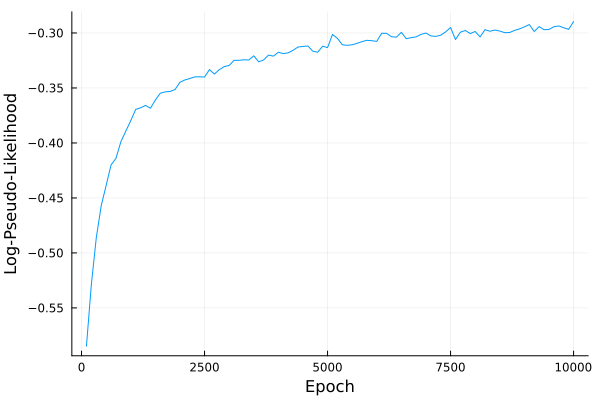

In [32]:
#Build data 
hidden_data2 = zeros(n_hidden2, n_samples)
for i in 1:n_samples
    hidden_data2[:,i] = RBMs.sample_h_from_v(rbm2, hidden_data1[:,i]) 
end

logfile = open("./Log/Stacked3.txt", "w+")


n_hidden3 = 64
data=hidden_data2

rbm3 = center(RBM(Binary((n_hidden2,)), Binary((n_hidden3,)), zeros(n_hidden2, n_hidden3)));
initialize!(rbm3, data);

pcd!(
    rbm3, data; 
    batchsize=256, iters=10000, steps=10, optim=Adam(1f-3), l1_weights=1f-3,
    vm=data[.., rand(1:size(hidden_data2)[end], 256)], callback
);

close(logfile)

logdata = readdlm("./Log/Stacked3.txt")
iter= logdata[:, 1]
lpl = logdata[:, 2]
plot(iter, lpl, legend=false)
xlabel!("Epoch")
ylabel!("Log-Pseudo-Likelihood")

[2023-05-04 15:57:44] Info: 1000 lpl = -0.4089321021560072, Δt = 0.035474792


[2023-05-04 15:57:50] Info: 2000 lpl = -0.35114081591935703, Δt = 0.035513542


[2023-05-04 15:57:57] Info: 3000 lpl = -0.32907459375293163, Δt = 0.034938083


[2023-05-04 15:58:03] Info: 4000 lpl = -0.3127744974054872, Δt = 0.035290667


[2023-05-04 15:58:09] Info: 5000 lpl = -0.3116692686535132, Δt = 0.035876333


[2023-05-04 15:58:15] Info: 6000 lpl = -0.30503988250536274, Δt = 0.0360395


[2023-05-04 15:58:20] Info: 7000 lpl = -0.301682545384015, Δt = 0.035838083


[2023-05-04 15:58:27] Info: 8000 lpl = -0.29454828679303857, Δt = 0.036143584


[2023-05-04 15:58:33] Info: 9000 lpl = -0.29243357404609066, Δt = 0.036751583


[2023-05-04 15:58:39] Info: 10000 lpl = -0.29584548562207175, Δt = 0.036262084


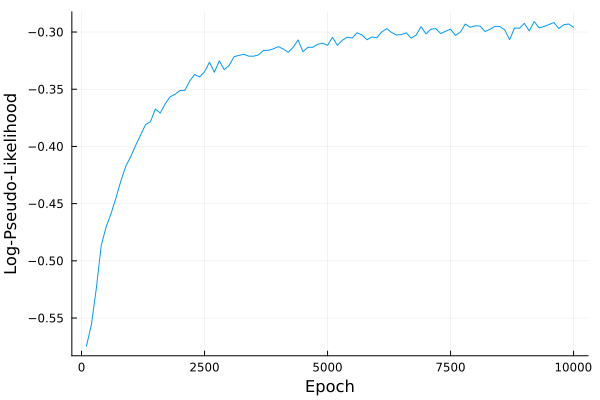

In [33]:
#Build data 
hidden_data3 = zeros(n_hidden3, n_samples)
for i in 1:n_samples
    hidden_data3[:,i] = RBMs.sample_h_from_v(rbm3, hidden_data2[:,i]) 
end

logfile = open("./Log/Stacked4.txt", "w+")


n_hidden4 = 32
data=hidden_data3

rbm4 = center(RBM(Binary((n_hidden3,)), Binary((n_hidden4,)), zeros(n_hidden3, n_hidden4)));
initialize!(rbm4, data);

pcd!(
    rbm4, data; 
    batchsize=256, iters=10000, steps=10, optim=Adam(1f-3), l1_weights=1f-3,
    vm=data[.., rand(1:size(hidden_data2)[end], 256)], callback
);

close(logfile)

logdata = readdlm("./Log/Stacked4.txt")
iter= logdata[:, 1]
lpl = logdata[:, 2]
plot(iter, lpl, legend=false)
xlabel!("Epoch")
ylabel!("Log-Pseudo-Likelihood")

[2023-05-04 15:59:14] Info: 1000 lpl = -0.4296068700511371, Δt = 0.015386208


[2023-05-04 15:59:16] Info: 2000 lpl = -0.3732966867393828, Δt = 0.016010292


[2023-05-04 15:59:20] Info: 3000 lpl = -0.3493209355359448, Δt = 0.017927875


[2023-05-04 15:59:23] Info: 4000 lpl = -0.3349735615558443, Δt = 0.016800708


[2023-05-04 15:59:26] Info: 5000 lpl = -0.32850080626194555, Δt = 0.016153916


[2023-05-04 15:59:30] Info: 6000 lpl = -0.31283100050770235, Δt = 0.020675


[2023-05-04 15:59:33] Info: 7000 lpl = -0.30457046951227057, Δt = 0.017882


[2023-05-04 15:59:38] Info: 8000 lpl = -0.3056669085971716, Δt = 0.030423792


[2023-05-04 15:59:42] Info: 9000 lpl = -0.3058138024042374, Δt = 0.016833125


[2023-05-04 15:59:45] Info: 10000 lpl = -0.2960524865540499, Δt = 0.054515416


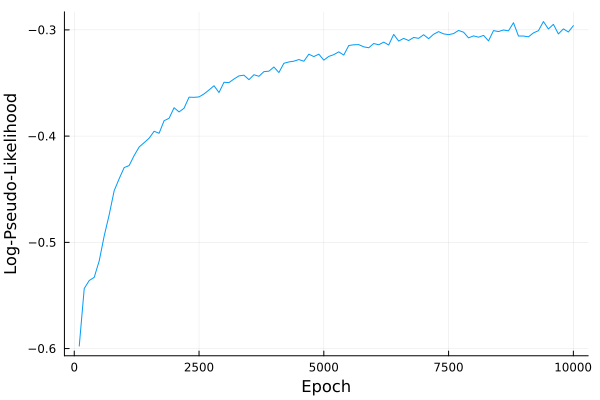

In [34]:
hidden_data4 = zeros(n_hidden4, n_samples)
for i in 1:n_samples
    hidden_data4[:,i] = RBMs.sample_h_from_v(rbm4, hidden_data3[:,i]) 
end

logfile = open("./Log/Stacked5.txt", "w+")


n_hidden5 = 16
data=hidden_data4

rbm5 = center(RBM(Binary((n_hidden4,)), Binary((n_hidden5,)), zeros(n_hidden4, n_hidden5)));
initialize!(rbm5, data);

pcd!(
    rbm5, data; 
    batchsize=256, iters=10000, steps=10, optim=Adam(1f-3), l1_weights=1f-3,
    vm=data[.., rand(1:size(hidden_data4)[end], 256)], callback
);

close(logfile)

logdata = readdlm("./Log/Stacked5.txt")
iter= logdata[:, 1]
lpl = logdata[:, 2]
plot(iter, lpl, legend=false)
xlabel!("Epoch")
ylabel!("Log-Pseudo-Likelihood")

[2023-05-04 15:59:53] Info: 1000 lpl = -0.4973347694101196, Δt = 0.01008625


[2023-05-04 15:59:54] Info: 2000 lpl = -0.47552060528646717, Δt = 0.004861916


[2023-05-04 15:59:56] Info: 3000 lpl = -0.43573850113211066, Δt = 0.011340458


[2023-05-04 15:59:58] Info: 4000 lpl = -0.4198931777354846, Δt = 0.005396666


[2023-05-04 16:00:00] Info: 5000 lpl = -0.38403686893146266, Δt = 0.010474667


[2023-05-04 16:00:02] Info: 6000 lpl = -0.35916280888174434, Δt = 0.017160667


[2023-05-04 16:00:05] Info: 7000 lpl = -0.34914031957041297, Δt = 0.005577209


[2023-05-04 16:00:07] Info: 8000 lpl = -0.35168620317867666, Δt = 0.005793708


[2023-05-04 16:00:08] Info: 9000 lpl = -0.34961333190965854, Δt = 0.015225625


[2023-05-04 16:00:10] Info: 10000 lpl = -0.34397127462444793, Δt = 0.00805625


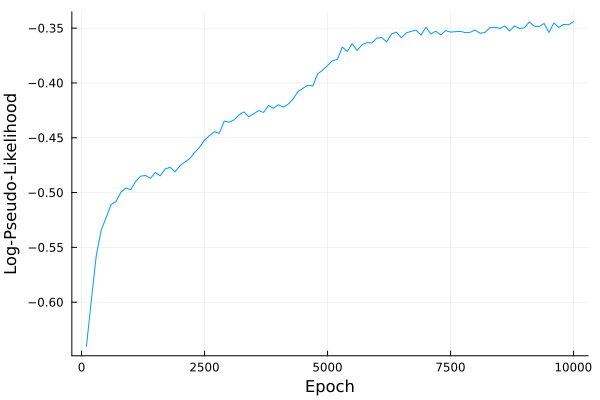

In [35]:
hidden_data5 = zeros(n_hidden5, n_samples)
for i in 1:n_samples
    hidden_data5[:,i] = RBMs.sample_h_from_v(rbm5, hidden_data4[:,i]) 
end

logfile = open("./Log/Stacked6.txt", "w+")


n_hidden6 = 4
data=hidden_data5

rbm6 = center(RBM(Binary((n_hidden5,)), Binary((n_hidden6,)), zeros(n_hidden5, n_hidden6)));
initialize!(rbm6, data);

pcd!(
    rbm6, data; 
    batchsize=256, iters=10000, steps=10, optim=Adam(1f-3), l1_weights=1f-3,
    vm=data[.., rand(1:size(hidden_data5)[end], 256)], callback
);

close(logfile)


hidden_data6 = zeros(n_hidden6, n_samples)
for i in 1:n_samples
    hidden_data6[:,i] = RBMs.sample_h_from_v(rbm6, hidden_data5[:,i]) 
end


logdata = readdlm("./Log/Stacked6.txt")
iter= logdata[:, 1]
lpl = logdata[:, 2]
plot(iter, lpl, legend=false)
xlabel!("Epoch")
ylabel!("Log-Pseudo-Likelihood")


In [ ]:
using JLD2
train = 0
load_hidden = 0
if train == 1
    jldsave("rbms.jld2"; rbm1, rbm2, rbm3, rbm4, rbm5, rbm6)
else 
    @load "rbms.jld2"  #fix this in a more elegant way e.g. store hidden data
    if load_hidden == 1
        data = train_fulldata_X[:,1:n_samples]
        hidden_data1 = zeros(n_hidden1, n_samples)
        for i in 1:n_samples
            hidden_data1[:,i]=RBMs.sample_h_from_v(rbm1, data[:,i]) 
        end
        hidden_data2 = zeros(n_hidden2, n_samples)
        for i in 1:n_samples
            hidden_data2[:,i] = RBMs.sample_h_from_v(rbm2, hidden_data1[:,i]) 
        end
        hidden_data3 = zeros(n_hidden3, n_samples)
        for i in 1:n_samples
            hidden_data3[:,i] = RBMs.sample_h_from_v(rbm3, hidden_data2[:,i]) 
        end
        hidden_data4 = zeros(n_hidden4, n_samples)
        for i in 1:n_samples
            hidden_data4[:,i] = RBMs.sample_h_from_v(rbm4, hidden_data3[:,i]) 
        end
        hidden_data5 = zeros(n_hidden5, n_samples)
        for i in 1:n_samples
            hidden_data5[:,i] = RBMs.sample_h_from_v(rbm5, hidden_data4[:,i]) 
        end
        hidden_data6 = zeros(n_hidden6, n_samples)
        for i in 1:n_samples
            hidden_data6[:,i] = RBMs.sample_h_from_v(rbm6, hidden_data5[:,i]) 
        end
    end
end

In [ ]:
v_data_rot, expl_ratio_v, O_v = PCA(train_fulldata_X[:,1:n_samples])
h1_data_rot, expl_ratio_h1, O_1 = PCA(hidden_data1)
h2_data_rot, expl_ratio_h2, O_2 = PCA(hidden_data2)
h3_data_rot, expl_ratio_h3, O_2 = PCA(hidden_data3)
h4_data_rot, expl_ratio_h4, O_2 = PCA(hidden_data4)





pca_v = [v_data_rot[end-i, :] for i in 0:3]
pca_h1 = [h1_data_rot[end-i, :] for i in 0:3]
pca_h2 = [h2_data_rot[end-i, :] for i in 0:3]
pca_h3 = [h3_data_rot[end-i, :] for i in 0:3]
pca_h4 = [h4_data_rot[end-i, :] for i in 0:3]




using DataFrames, StatsPlots
df_v = DataFrame(PC1=pca_v[1], PC2=pca_v[2], PC3=pca_v[3], PC4=pca_v[4], Label=train_y[1:n_samples])
df_h1 = DataFrame(PC1=pca_h1[1], PC2=pca_h1[2], PC3=pca_h1[3], PC4=pca_h1[4], Label=train_y[1:n_samples])
df_h2 = DataFrame(PC1=pca_h2[1], PC2=pca_h2[2], PC3=pca_h2[3], PC4=pca_h2[4], Label=train_y[1:n_samples]) 
df_h3 = DataFrame(PC1=pca_h3[1], PC2=pca_h3[2], PC3=pca_h3[3], PC4=pca_h3[4], Label=train_y[1:n_samples]) 
df_h4 = DataFrame(PC1=pca_h4[1], PC2=pca_h4[2], PC3=pca_h4[3], PC4=pca_h4[4], Label=train_y[1:n_samples]) 


p1 = scatter(df_v.PC1 , df_v.PC2, markerstrokewidth=0.1, ms=3, group=df_v.Label, title="Visible PC1 vs PC2")
p2 = scatter(df_h1.PC1 , markerstrokewidth=0.1, ms=3, df_h1.PC2, group=df_h1.Label, title="Hidden1 PC1 vs PC2", legend=false)
p3 = scatter(df_h2.PC1 , markerstrokewidth=0.1, ms=3, df_h2.PC2, group=df_h2.Label, title="Hidden2 PC1 vs PC2", legend=false)
p4 = scatter(df_h3.PC1 , markerstrokewidth=0.1, ms=3, df_h3.PC2, group=df_h3.Label, title="Hidden3 PC1 vs PC2", legend=false)
p5 = scatter(df_h4.PC1 , markerstrokewidth=0.1, ms=3, df_h4.PC2, group=df_h4.Label, title="hidden4 PC1 vs PC2", legend=false)

plot(p1, p2, p3, p4, p5, layout=(3,2), size=(1200,800))

# Statistics of Last Hidden Layers

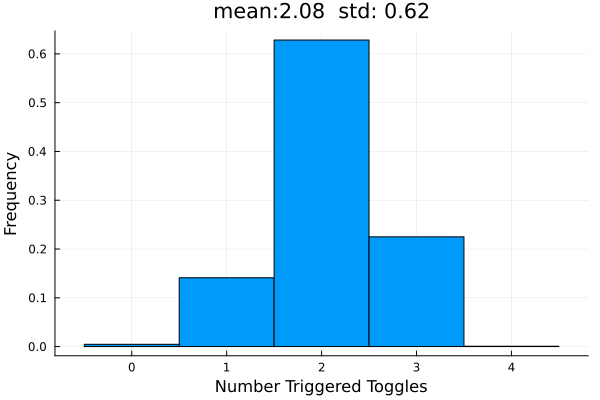

In [37]:
summed_seq = sum(hidden_data6, dims=1)
m = mean(summed_seq)
s = std(summed_seq)

b_range = range(-0.5, 4.5, length=6)

histogram(Transpose(summed_seq), bins=b_range, normalize=:pdf, label=nothing)
xlabel!("Number Triggered Toggles")
ylabel!("Frequency")
title!("mean:$(round(m, digits=2))  std: $(round(s, digits=2))")

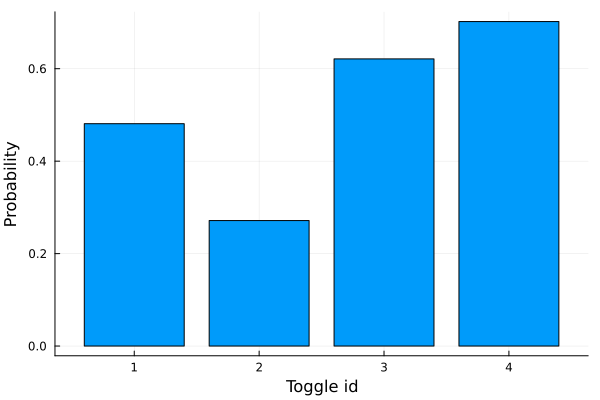

In [38]:
bar(1:4, mean(hidden_data6, dims=2), legend=false)
xlabel!("Toggle id")
ylabel!("Probability")

In [39]:
using StatsBase: countmap
data_joined = [join(Int.(hidden_data6[:,i]), "") for i in 1:size(hidden_data4)[2]]
counts = countmap(data_joined)


Dict{String, Int64} with 16 entries:
  "0110" => 6520
  "0011" => 2652
  "1100" => 2
  "1011" => 5415
  "0001" => 2974
  "1001" => 6222
  "1110" => 65
  "1101" => 23
  "1010" => 151
  "0010" => 489
  "1111" => 17
  "0101" => 7
  "1000" => 12
  "0100" => 19
  "0000" => 118
  "0111" => 68

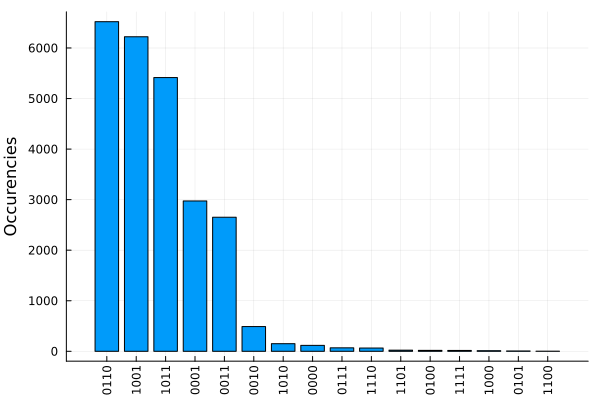

In [40]:
indipkey = collect(keys(counts))
vals  = collect(values(counts))
order = sortperm(vals, rev=true) 
indipkey = indipkey[order]
vals = vals[order]

bar(1:length(vals), vals, legend=false)
xticks!(1:length(vals), indipkey, xrotation =90)
ylabel!("Occurencies")

# Sampling from Codes

In [24]:
using RestrictedBoltzmannMachines: sample_h_from_v, sample_v_from_h

function bottom_sampler(rbm, N)
    rdm_idx = rand(1:n_samples)
    conf = train_fulldata_X[:,rdm_idx]
    data = zeros((size(conf)[1], N))
    for i in 1:N
        if i%100==0
            rdm_idx = rand(1:n_samples)
            conf = train_fulldata_X[:,rdm_idx]
        end
        conf_h_temp = sample_h_from_v(rbm, conf)
        conf = sample_v_from_h(rbm, conf_h_temp)
        data[:,i] = conf
    end
    return data
end


bottom_seq = bottom_sampler(rbm1, 10000)

784×10000 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 ⋮                        ⋮              ⋱            ⋮                   
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 

The energy distribution with direct recursive sampling are generally slightly higher than the original MNIST datatset ones, so now we'll try to implement the deep tempering way of sampling. 

In [18]:
function E_v(v_conf, rbm)
    Γ_sum = 0
    for μ in 1:length(rbm.hidden)
        Γ_sum += log( 2*cosh( rbm.hidden.θ[μ] + (Transpose(rbm.w)*v_conf)[μ] ))
    end 
    return - (dot(rbm.visible.θ, v_conf) + Γ_sum)
end

function E_h(h_conf, rbm)
    Γ_sum = 0
    for i in 1:length(rbm.visible)  
        Γ_sum += log( 2*cosh( rbm.visible.θ[i] + (rbm.w*h_conf)[i] ))
    end 
    return - (dot(rbm.hidden.θ, h_conf) + Γ_sum)
end

E_h (generic function with 1 method)

In [19]:
function A(conf, rbm_n, rbm_nplus1, N_MC=1)
    beta=1
    conf_v_nplus1 = sample_v_from_h(rbm_nplus1, conf) 
    #conf_h_n = sample_v_from_h(rbm_nplus1, conf) #partire dalla stessa? oppure risamplare da sopra?
    conf_h_n = conf_v_nplus1
    for step in 1:N_MC
        #dynamics on rbm down:
        conf_v_temp = sample_v_from_h(rbm_n, conf_h_n)
        conf_h_n = sample_h_from_v(rbm_n, conf_v_temp)

    end  
    E = E_v(conf_v_nplus1, rbm_nplus1) + E_h(conf_h_n, rbm_n)
    E_swap =  E_v(conf_h_n, rbm_nplus1) + E_h(conf_v_nplus1, rbm_n)
    A = min(1, exp(beta*(E-E_swap))) 

    return A, conf_v_nplus1
end

A (generic function with 2 methods)

In [69]:
function swapper(rbm_up, rbm_down, seq)
    new_h = nothing
    for trial in 1:100
        r = rand()
        a, new_h = A(seq, rbm_down, rbm_up)
        if r < a 
            if trial > 80
                print("$trial \n")
            end
            break
        end
    end
    return new_h
end

function deep_tempering_from_top(conf, Neq=10)
    h5 = swapper(rbm6, rbm5, conf)
    h4 = swapper(rbm5, rbm4, h5)
    h3 = swapper(rbm4, rbm3, h4)
    h2 = swapper(rbm3, rbm2, h3)
    h1 = swapper(rbm2, rbm1, h2)
    seq = sample_v_from_h(rbm1, h1)
    for i in 1:Neq
        h_temp = sample_h_from_v(rbm1, seq)
        seq = sample_v_from_h(rbm1, h_temp)
    end
    return seq
end

function seq_generator(toggle_conf, Neq=15)
    v6 = RBMs.sample_v_from_h(rbm6, toggle_conf)
    h5 = v6
    v5 = RBMs.sample_v_from_h(rbm5, h5)
    h4 = v5
    v4 = RBMs.sample_v_from_h(rbm4, h4)
    h3 = v4 
    v3 = RBMs.sample_v_from_h(rbm3, h3)
    h2 = v3
    v2 = RBMs.sample_v_from_h(rbm2, h2)
    h1 = v2
    seq = RBMs.sample_v_from_h(rbm1, h1)
    for i in 1:Neq
        h_temp = sample_h_from_v(rbm1, seq)
        seq = sample_v_from_h(rbm1, h_temp)
    end
    return seq
end

seq_generator (generic function with 2 methods)

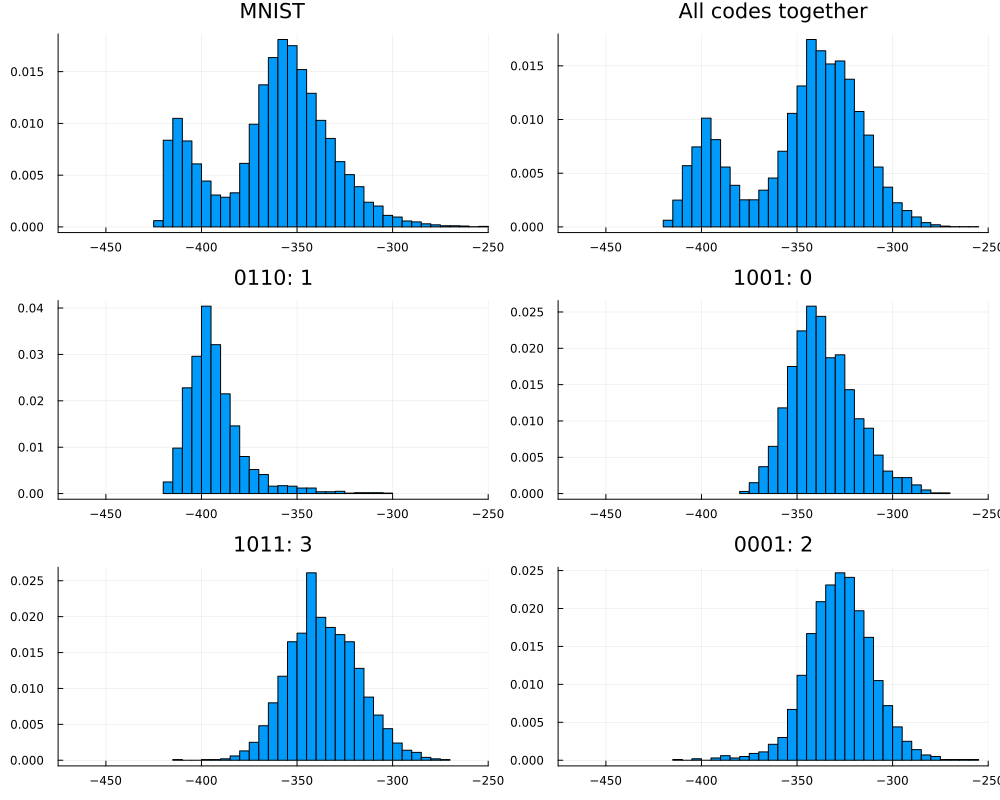

In [92]:
N = 2000

seq0110 = [seq_generator([0,1,1,0]) for i in 1:N]
seq1001 = [seq_generator([1,0,0,1]) for i in 1:N]
seq1011 = [seq_generator([1,0,1,1]) for i in 1:N]
seq0001 = [seq_generator([0,0,0,1]) for i in 1:N]

#score_mnist = [RBMs.free_energy(rbm1, train_fulldata_X[:,i]) for i in 1:n_samples]
score_0110 = [RBMs.free_energy(rbm1, seq) for seq in seq0110]
score_1001 = [RBMs.free_energy(rbm1, seq) for seq in seq1001]
score_1011 = [RBMs.free_energy(rbm1, seq) for seq in seq1011]
score_0001 = [RBMs.free_energy(rbm1, seq) for seq in seq0001]
score_bottom = [RBMs.free_energy(rbm1, bottom_seq[:,i]) for i in 1:size(bottom_seq)[2]]


p1=histogram(score_mnist, normalize=:pdf, title= "MNIST")
#p2=histogram(score_bottom, normalize=:pdf, title= "Usual Sampling")
p2=histogram(vcat(score_0110, score_1001, score_1011, score_0001), normalize=:pdf, title= "All codes together")
p3=histogram(score_0110, normalize=:pdf, title= "0110: 1")
p4=histogram(score_1001, normalize=:pdf, title= "1001: 0")
p5=histogram(score_1011, normalize=:pdf, title= "1011: 3")
p6=histogram(score_0001, normalize=:pdf, title= "0001: 2")

plot(p1,p2,p3,p4,p5,p6, layout=(3,2),legend=false, size= (1000,800),  xlims = (-475, -250))

In [37]:
function rotate_along_pca(collection)
    data = zeros(length(collection),2)
    for i in 1:length(collection)
        data[i,:]=(transpose(O_v)*collection[i])[end-1:end]
    end
    return data
end
    

rotate_along_pca (generic function with 1 method)

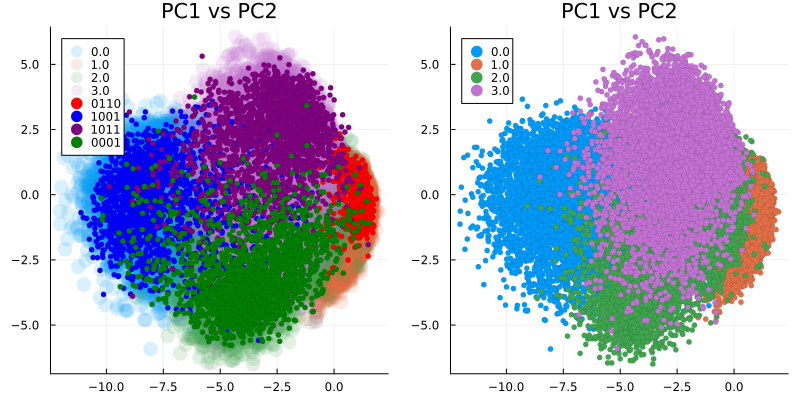

In [89]:
p1 = scatter(df_v.PC1, df_v.PC2, group=df_v.Label,markerstrokewidth=0, ms=8, markeralpha=0.15, title="PC1 vs PC2")
scatter!(rotate_along_pca(seq0110)[:,2], rotate_along_pca(seq0110)[:,1], label = "0110", color=:red, markerstrokewidth=0.05, ms=3)
scatter!(rotate_along_pca(seq1001)[:,2], rotate_along_pca(seq1001)[:,1], label = "1001", color=:blue, markerstrokewidth=0.05, ms=3)
scatter!(rotate_along_pca(seq1011)[:,2], rotate_along_pca(seq1011)[:,1], label = "1011", color=:purple, markerstrokewidth=0.05, ms=3)
scatter!(rotate_along_pca(seq0001)[:,2], rotate_along_pca(seq0001)[:,1], label = "0001", color=:green, markerstrokewidth=0.05, ms=3)




p2 = scatter(df_v.PC1, df_v.PC2, group=df_v.Label, markerstrokewidth=0.05, ms=3, markeralpha=1, title="PC1 vs PC2")
plot(p1, p2, size = (800,400))

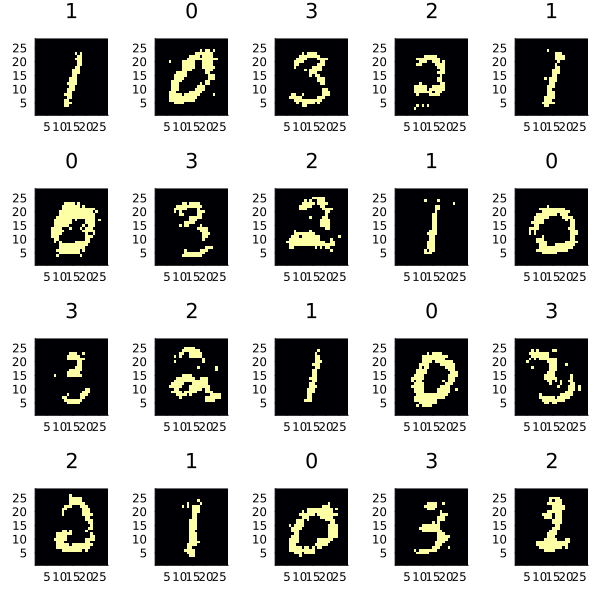

In [90]:
figs=[]
for i in 1:5
    idx = rand(1:N)
    push!(figs, heatmap(rotl90(reshape(seq0110[idx], (28,28))), legend = :none, title="1"))
    push!(figs, heatmap(rotl90(reshape(seq1001[idx], (28,28))), legend = :none, title="0"))
    push!(figs, heatmap(rotl90(reshape(seq1011[idx], (28,28))), legend = :none, title="3"))
    push!(figs, heatmap(rotl90(reshape(seq0001[idx], (28,28))), legend = :none, title="2"))
end
plot(figs..., size=(600,600))